For Pleiades Dataset:

Mounted at /content/drive


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pas

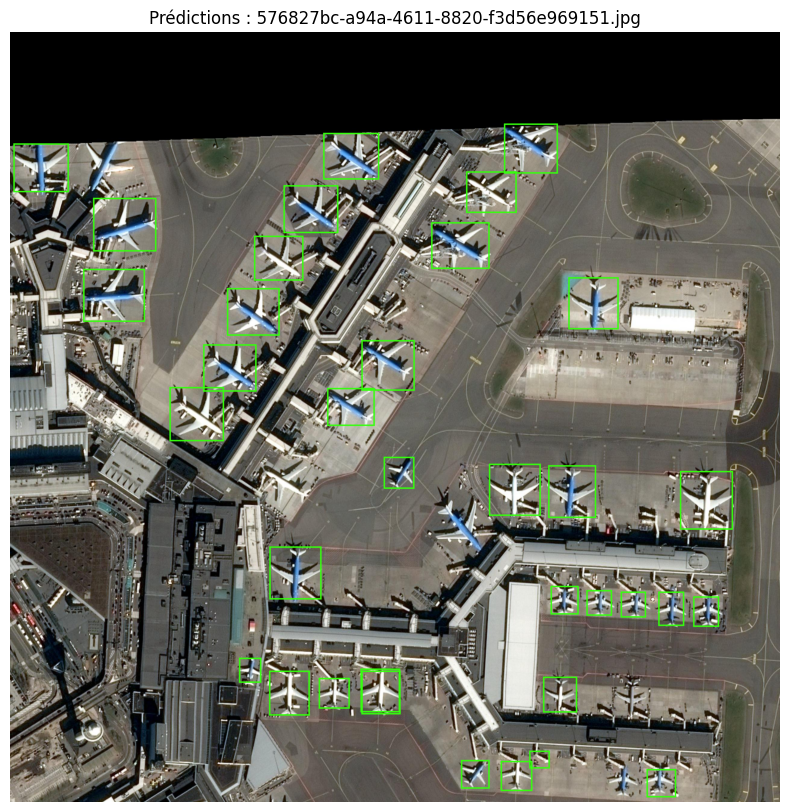

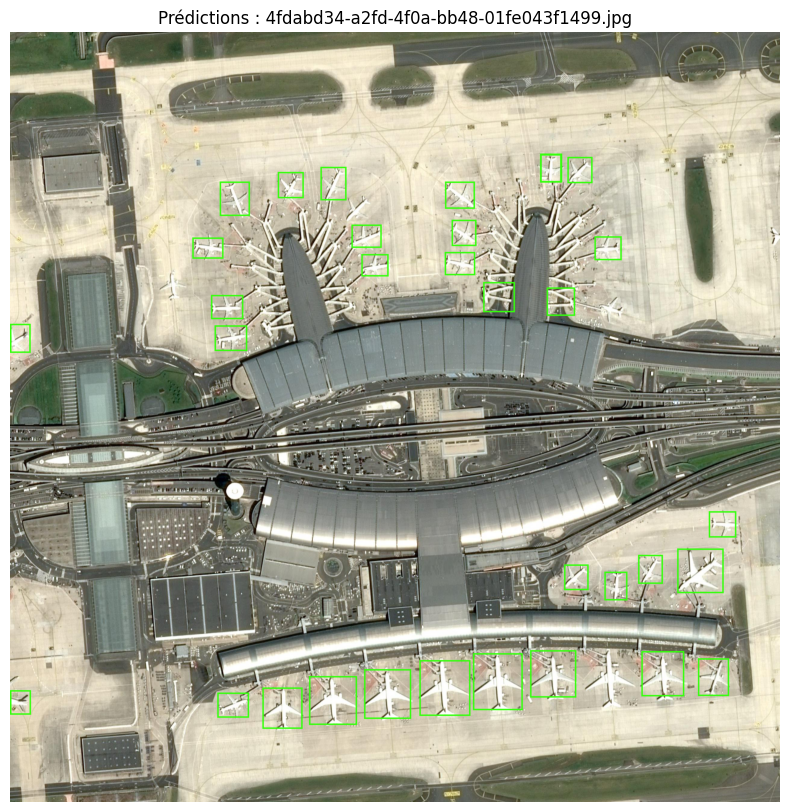

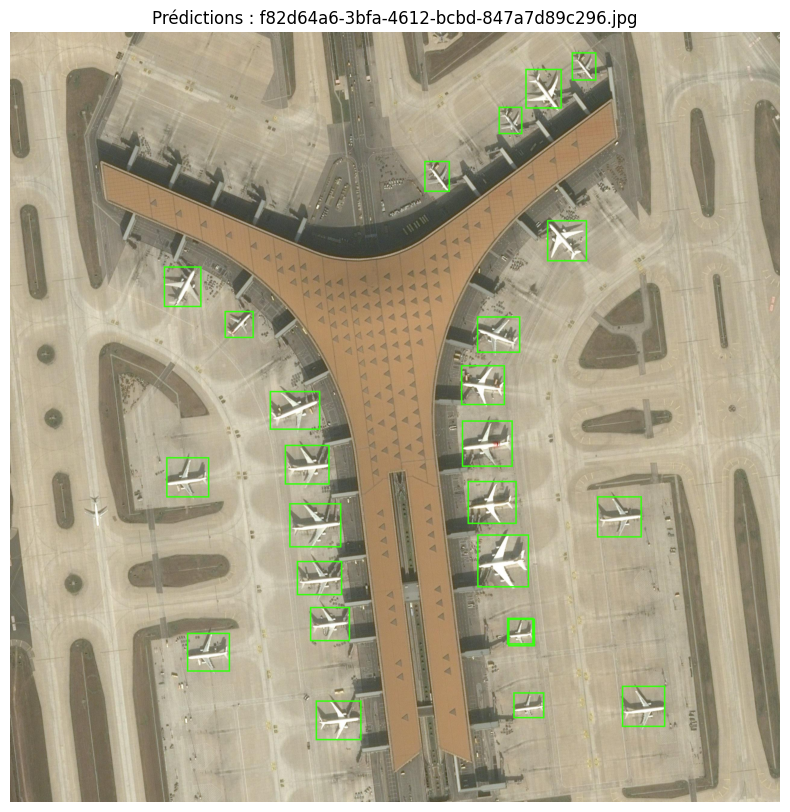

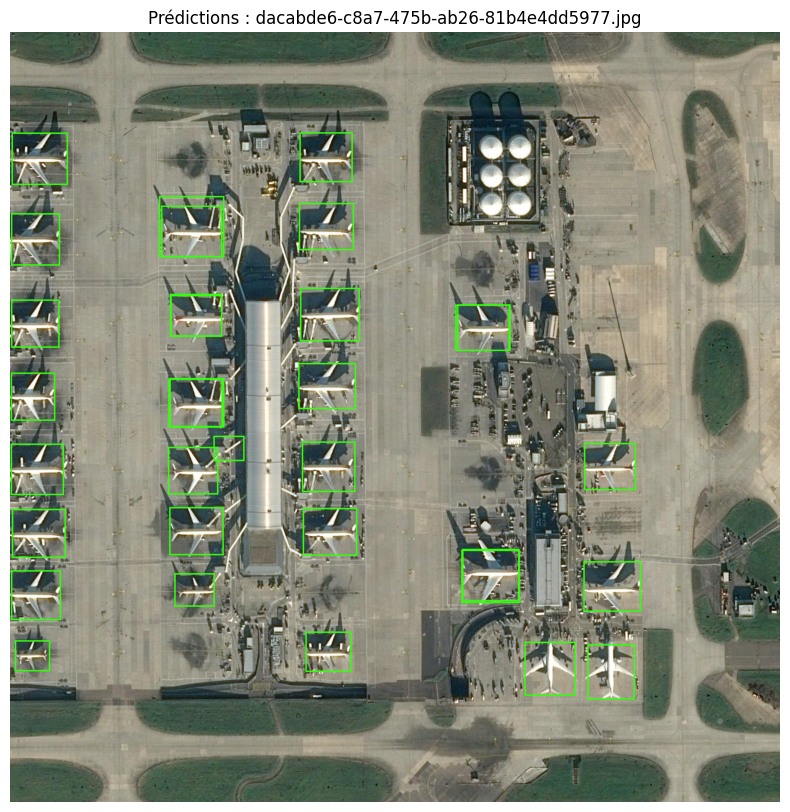

In [ ]:
# 📁 Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 📦 Imports
import os
import json
import torch
from PIL import Image, ImageDraw
from transformers import DabDetrForObjectDetection, AutoImageProcessor
from matplotlib import pyplot as plt

# 📁 Chemins
model_path = "/content/drive/MyDrive/dab_detr_Pleiades"
images_folder = "/content/drive/MyDrive/Predicted_Images/"
json_output_folder = "/content/drive/MyDrive/JSONS_DEFORMABLE_DETR_Optique/"
annotated_images_folder = "/content/drive/MyDrive/DAB_DETR_Optical_Images_Annotated/"
os.makedirs(json_output_folder, exist_ok=True)
os.makedirs(annotated_images_folder, exist_ok=True)

# 🔧 Charger le modèle et le processor
model = DabDetrForObjectDetection.from_pretrained(model_path, id2label={0: "Airplane"})
processor = AutoImageProcessor.from_pretrained(model_path)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device).eval()

# 🔁 Traitement des images
for image_name in os.listdir(images_folder):
    if not image_name.lower().endswith((".jpg", ".jpeg", ".png", ".tif")):
        continue

    image_path = os.path.join(images_folder, image_name)
    image = Image.open(image_path).convert("RGB")

    # 🔄 Prétraitement
    inputs = processor(images=image, return_tensors="pt").to(device)

    # 🧠 Prédictions
    with torch.no_grad():
        outputs = model(**inputs)

    # 📦 Post-processing
    target_sizes = torch.tensor([image.size[::-1]]).to(device)
    results = processor.post_process_object_detection(outputs, threshold=0.4, target_sizes=target_sizes)[0]

    draw = ImageDraw.Draw(image)
    annotations = []

    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = [round(v, 2) for v in box.tolist()]  # [xmin, ymin, xmax, ymax]
        coco_box = [box[0], box[1], box[2] - box[0], box[3] - box[1]]
        draw.rectangle(box, outline="#35ff0d", width=5)  # ✅ uniquement la boîte

        annotations.append({
            "image_id": image_name,
            "category_id": label.item(),
            "bbox": coco_box,
            "score": round(score.item(), 3)
        })

    # 💾 JSON
    json_path = os.path.join(json_output_folder, image_name.rsplit('.', 1)[0] + ".json")
    with open(json_path, "w") as f:
        json.dump(annotations, f, indent=2)

    # 💾 Image annotée
    annotated_image_path = os.path.join(annotated_images_folder, image_name)
    image.save(annotated_image_path)

    # 📸 Affichage
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(f"Prédictions : {image_name}")
    plt.axis("off")
    plt.show()

For SSDD:

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


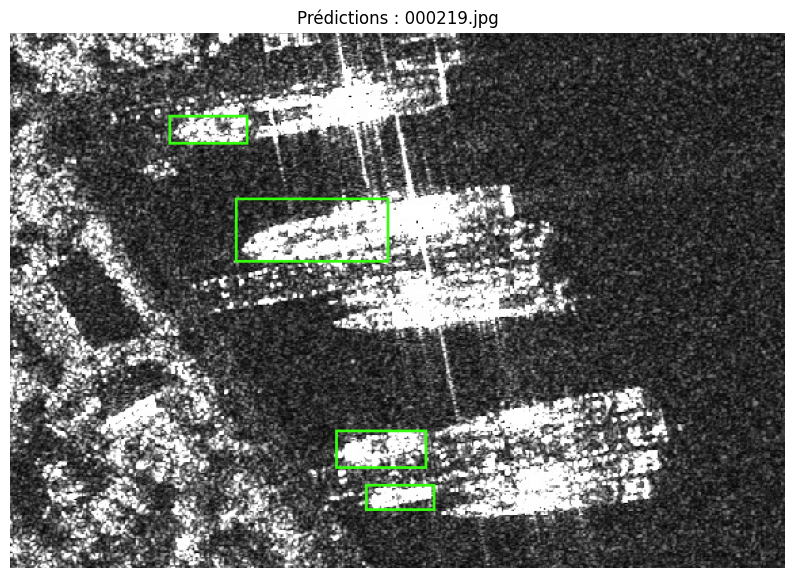

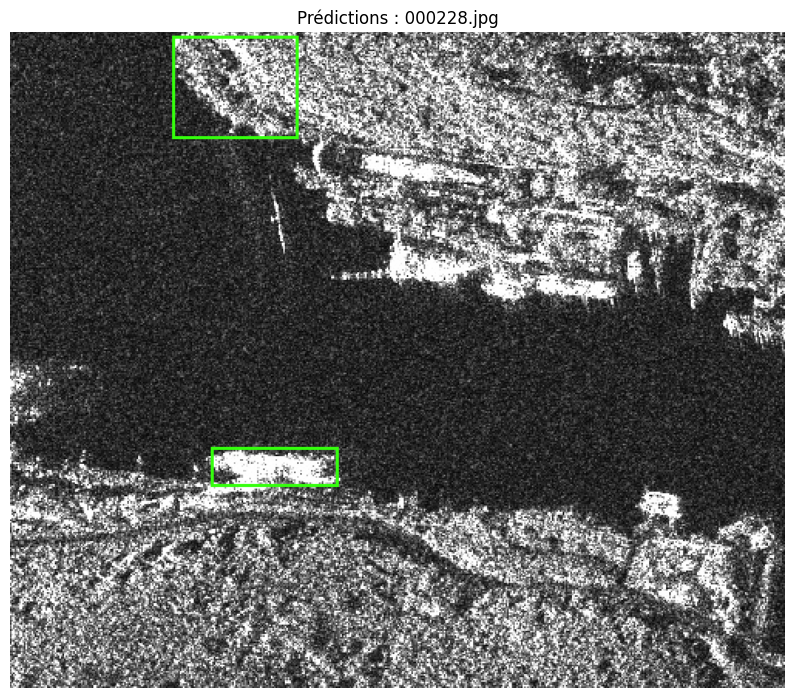

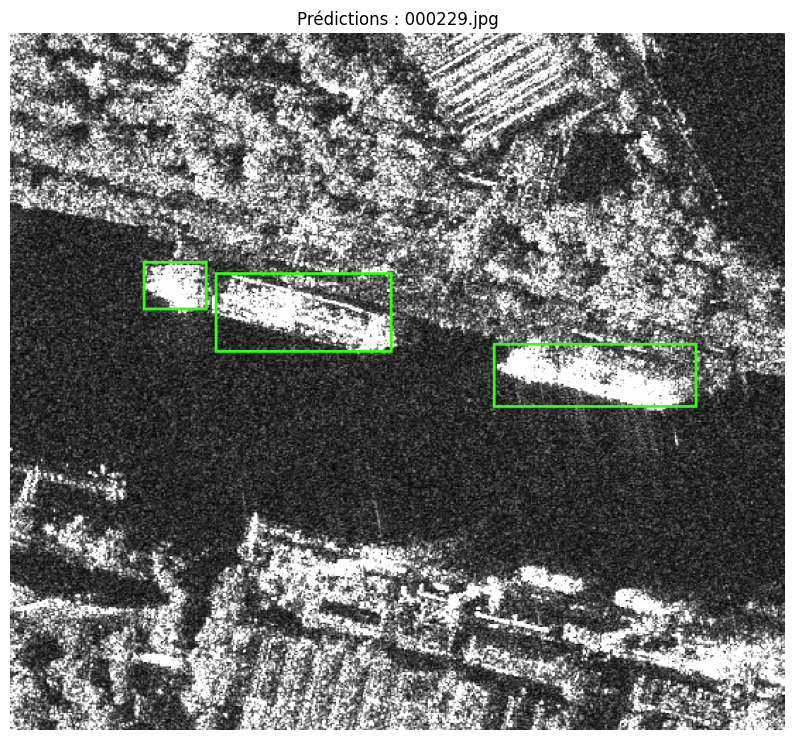

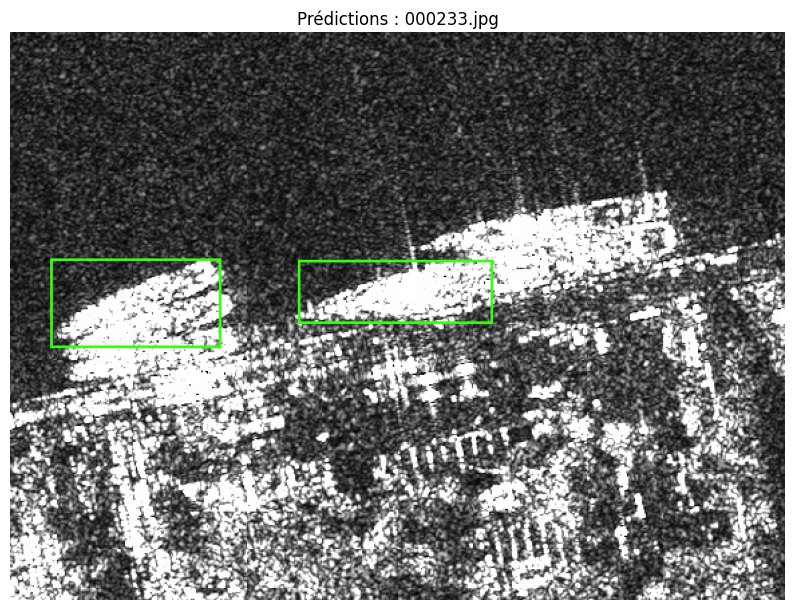

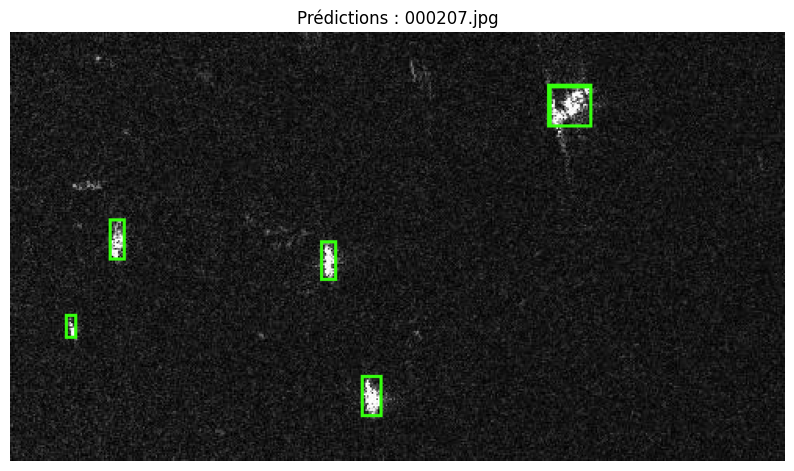

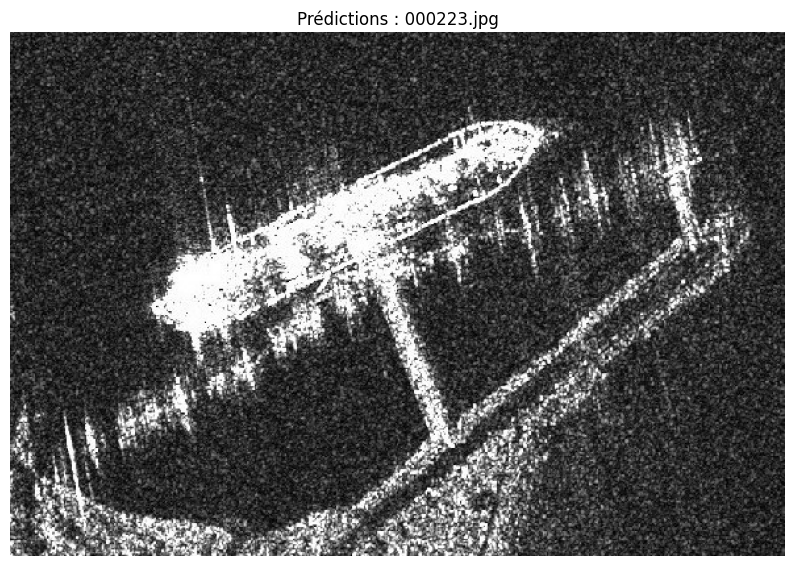

In [ ]:
# 📁 Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 📦 Imports
import os
import json
import torch
from PIL import Image, ImageDraw
from transformers import DabDetrForObjectDetection, AutoImageProcessor
from matplotlib import pyplot as plt

# 📁 Chemins
model_path = "/content/drive/MyDrive/dab_detr_SSDD"
images_folder = "/content/drive/MyDrive/Predicted_SAR_Images/"
json_output_folder = "/content/drive/MyDrive/JSONS_DEFORMABLE_DETR_SSDD/"
annotated_images_folder = "/content/drive/MyDrive/DAB_DETR_SAR_Images_Annotated/"
os.makedirs(json_output_folder, exist_ok=True)
os.makedirs(annotated_images_folder, exist_ok=True)

# 🔧 Charger le modèle et le processor
model = DabDetrForObjectDetection.from_pretrained(model_path, id2label={0: "Ship"})
processor = AutoImageProcessor.from_pretrained(model_path)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device).eval()

# 🔁 Traitement des images
for image_name in os.listdir(images_folder):
    if not image_name.lower().endswith((".jpg", ".jpeg", ".png", ".tif")):
        continue

    image_path = os.path.join(images_folder, image_name)
    image = Image.open(image_path).convert("RGB")

    # 🔄 Prétraitement
    inputs = processor(images=image, return_tensors="pt").to(device)

    # 🧠 Prédictions
    with torch.no_grad():
        outputs = model(**inputs)

    # 📦 Post-processing
    target_sizes = torch.tensor([image.size[::-1]]).to(device)
    results = processor.post_process_object_detection(outputs, threshold=0.4, target_sizes=target_sizes)[0]

    draw = ImageDraw.Draw(image)
    annotations = []

    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = [round(v, 2) for v in box.tolist()]  # [xmin, ymin, xmax, ymax]
        coco_box = [box[0], box[1], box[2] - box[0], box[3] - box[1]]
        draw.rectangle(box, outline="#35ff0d", width=2)  # ✅ uniquement la boîte

        annotations.append({
            "image_id": image_name,
            "category_id": label.item(),
            "bbox": coco_box,
            "score": round(score.item(), 3)
        })

    # 💾 JSON
    json_path = os.path.join(json_output_folder, image_name.rsplit('.', 1)[0] + ".json")
    with open(json_path, "w") as f:
        json.dump(annotations, f, indent=2)

    # 💾 Image annotée
    annotated_image_path = os.path.join(annotated_images_folder, image_name)
    image.save(annotated_image_path)

    # 📸 Affichage
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(f"Prédictions : {image_name}")
    plt.axis("off")
    plt.show()